<a href="https://colab.research.google.com/github/RAJ-15012006/28_July_WD-first-project1/blob/main/TimeSeries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

### Using Airpassenger data of past to predict future air passenger traffic

In [ ]:
data = pd.read_csv('AirPassengers.csv',parse_dates=[0],index_col =[0])

In [ ]:
data

,Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121
...,...
1960-08-01,606
1960-09-01,508
1960-10-01,461


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 144 entries, 1949-01-01 to 1960-12-01
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   Passengers  144 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


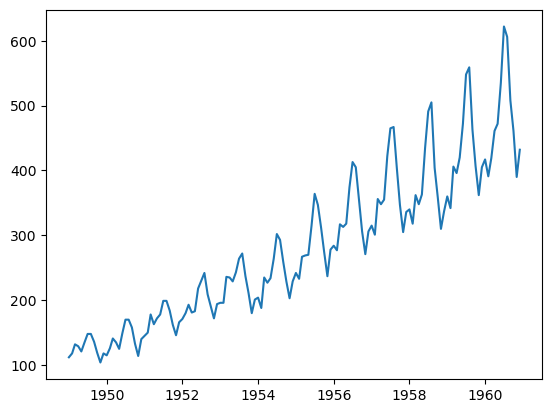

In [ ]:
import matplotlib.pyplot as plt
plt.plot(data)
plt.show()

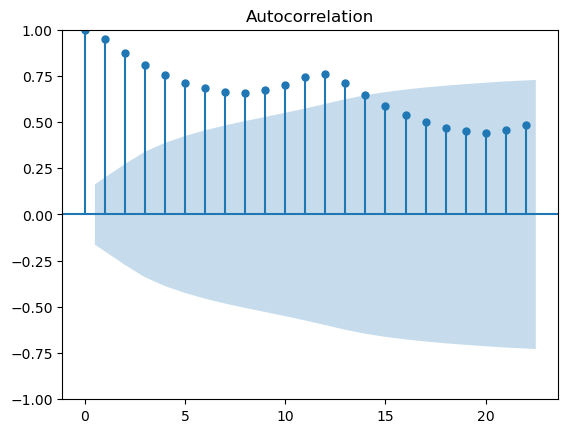

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(data); # lags annualy after 12 lines i.e. 12 months

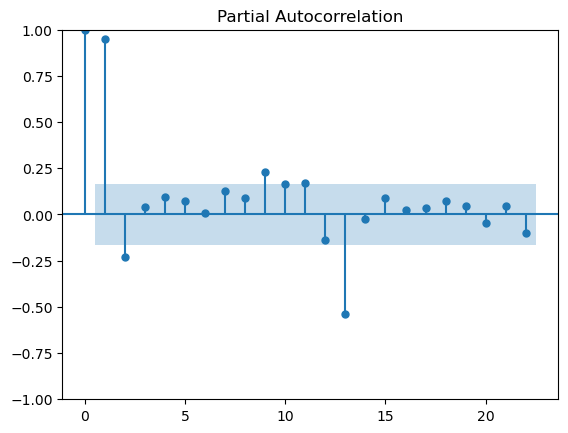

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(data); # direct comparision no avg,  compare with previous value and tells corelation 1 st positive 3 rd negative as less population eg:- 12 :- last 12 month what is it record

In [ ]:
from statsmodels.tsa.stattools import adfuller
test = adfuller(data.Passengers,autolag = 'AIC') # 0.81> crtical value= not rejected
test # 0,99> 0.05 -> shows trend
#Test statistic, P value, no. of lags, no. of observations, critical values
#Ho: Data is non stationary
#Ha: Data is Stationary
#If p<0.05, reject null hypothesis and accept alternate hypothesis
#p being 0.99, you have to accept null hypothesis

(0.8153688792060597,
 0.9918802434376411,
 13,
 130,
 {'1%': -3.4816817173418295,
  '5%': -2.8840418343195267,
  '10%': -2.578770059171598},
 996.692930839019)

In [ ]:
#data.diff(periods=1)
data1 = data.diff(periods=1).iloc[1:] # converting data to stationaryv, taking difference between 2nd and 1st data

In [ ]:
data1

,Passengers
Month,
1949-02-01,6.0
1949-03-01,14.0
1949-04-01,-3.0
1949-05-01,-8.0
1949-06-01,14.0
...,...
1960-08-01,-16.0
1960-09-01,-98.0
1960-10-01,-47.0


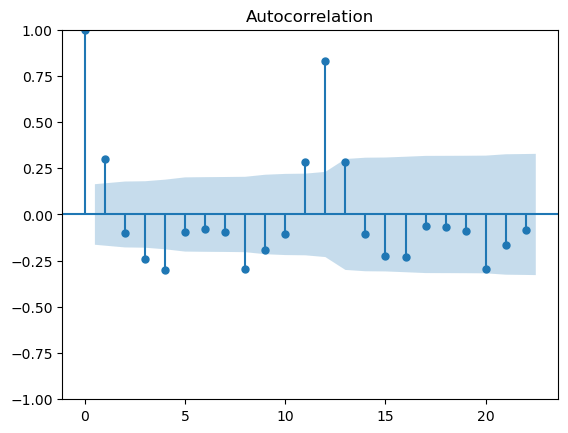

In [ ]:
plot_acf(data1); # remove trend and new daata, everything comes under blue range

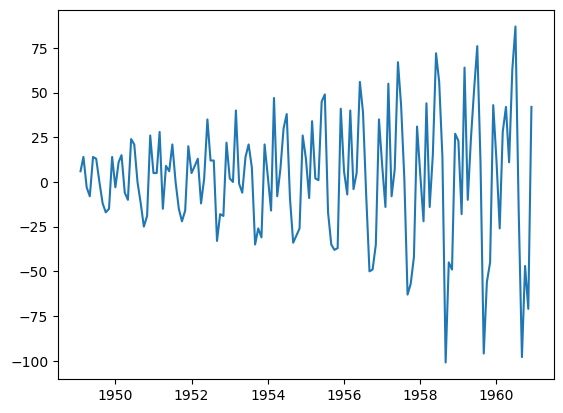

In [ ]:
plt.plot(data1)
plt.show()

In [ ]:
train = data1[:100]
test =data1[100:]

In [ ]:
#Basic autoregression
from statsmodels.tsa.ar_model import ar_select_order
mod = ar_select_order(data,maxlag=15,glob=True)   #Gives you the best lags as an array
mod.ar_lags # false ->glob - chose best single lag length, true -> best fit lags, output i best lag , best corelation

[1, 2, 12, 13, 14]

In [ ]:
from statsmodels.tsa.ar_model import AutoReg
ar_model = AutoReg(data[:100],lags=[1, 2, 12, 13, 14])  #Creating a model, with our own lags
my_model = ar_model.fit()    #Fitting the model, training

In [ ]:
pred = my_model.predict(start=100,end=142)    #Making predictions from 100 to 142 values not 144, if 144 line will extend

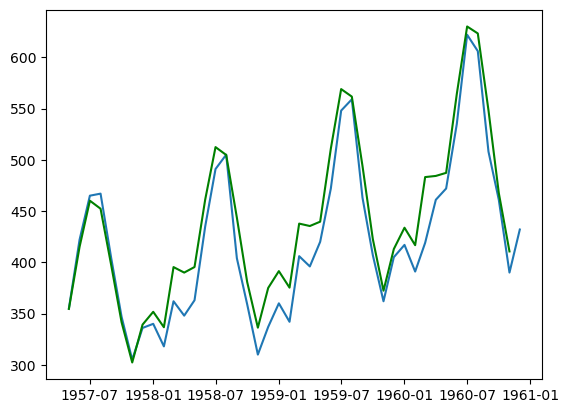

In [ ]:
plt.plot(data[100:])   #Graphing actuals
plt.plot(pred,color='green')   #Graphing prediction

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


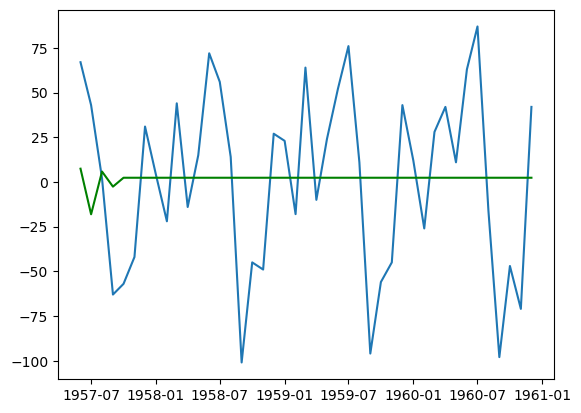

In [ ]:
#For MA, we don't have direct implmentations
#You can use arima (p,d,q) - Make p and d as zero, so that effectively i'm implementing a MA model
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(data1[:100],order=(0,0,4)) # stationary data 1st 100 values , p-> last 8 lags, d -> series stationary(difference), 4 -> how many prev error for prediction
my_model = model.fit()
pred = my_model.predict(start=100,end=142)
plt.plot(data1[100:])   #Graphing actuals
plt.plot(pred,color='green')   #Graphing prediction   it is at cente because at diff we cancel above and downward value therefre pred = 0

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


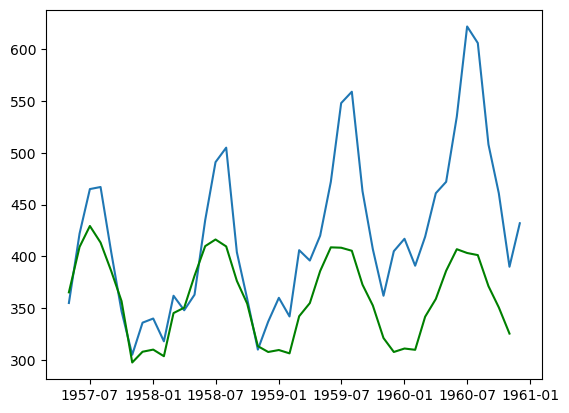

In [ ]:
#Full ARIMA implemented
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(data[:100],order=(8,1,4)) # we are improving p=8 > past 8 lags to predict, d -> series is diff 1, 4 -> model use last 4  errors
my_model = model.fit()
pred = my_model.predict(start=100,end=142)
plt.plot(data[100:])   #Graphing actuals
plt.plot(pred,color='green')   #Graphing prediction

In [ ]:
import itertools
p = range(0,15)
d = range(0,3)
q = range(0,15)
pdq = list(itertools.product(p,d,q))
pdq # making pnc all combination as model unable to pick

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (0, 0, 4),
 (0, 0, 5),
 (0, 0, 6),
 (0, 0, 7),
 (0, 0, 8),
 (0, 0, 9),
 (0, 0, 10),
 (0, 0, 11),
 (0, 0, 12),
 (0, 0, 13),
 (0, 0, 14),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 1, 3),
 (0, 1, 4),
 (0, 1, 5),
 (0, 1, 6),
 (0, 1, 7),
 (0, 1, 8),
 (0, 1, 9),
 (0, 1, 10),
 (0, 1, 11),
 (0, 1, 12),
 (0, 1, 13),
 (0, 1, 14),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (0, 2, 3),
 (0, 2, 4),
 (0, 2, 5),
 (0, 2, 6),
 (0, 2, 7),
 (0, 2, 8),
 (0, 2, 9),
 (0, 2, 10),
 (0, 2, 11),
 (0, 2, 12),
 (0, 2, 13),
 (0, 2, 14),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (1, 0, 4),
 (1, 0, 5),
 (1, 0, 6),
 (1, 0, 7),
 (1, 0, 8),
 (1, 0, 9),
 (1, 0, 10),
 (1, 0, 11),
 (1, 0, 12),
 (1, 0, 13),
 (1, 0, 14),
 (1, 1, 0),
 (1, 1, 1),
 (1, 1, 2),
 (1, 1, 3),
 (1, 1, 4),
 (1, 1, 5),
 (1, 1, 6),
 (1, 1, 7),
 (1, 1, 8),
 (1, 1, 9),
 (1, 1, 10),
 (1, 1, 11),
 (1, 1, 12),
 (1, 1, 13),
 (1, 1, 14),
 (1, 2, 0),
 (1, 2, 1),
 (1, 2, 2),
 (1, 2, 3),
 (1, 2, 4),
 (1, 2, 5),
 (1

(0, 0, 0) 1148.190653813063
(0, 0, 1) 1033.375602829621
(0, 0, 2) 989.3197446275536
(0, 0, 3) 940.549480615293
(0, 0, 4) 935.3576336525525
(0, 0, 5) 927.5402427240609
(0, 0, 6) 928.0521912248525
(0, 0, 7) 908.2546894230585
(0, 0, 8) 924.8688953490524
(0, 0, 9) 926.7233817643208
(0, 0, 10) 893.0228361404827
(0, 0, 11) 909.7846514808456
(0, 0, 12) 908.5829968702823
(0, 0, 13) 894.7444604797902
(0, 0, 14) 899.6005875051924
(0, 1, 0) 908.784995814377
(0, 1, 1) 903.5482389933226
(0, 1, 2) 899.4681439906326
(0, 1, 3) 899.532867724191
(0, 1, 4) 890.1594722132564
(0, 1, 5) 888.3657098275798
(0, 1, 6) 885.4316886716549
(0, 1, 7) 885.8270593077239
(0, 1, 8) 872.1006965584032
(0, 1, 9) 874.0040193829154
(0, 1, 10) 870.3656266637602
(0, 1, 11) 863.8926044970777
(0, 1, 12) 858.2886651970713
(0, 1, 13) 851.9086225858086
(0, 1, 14) 850.1005083479437
(0, 2, 0) 944.3964607216842
(0, 2, 1) 906.2118283914702
(0, 2, 2) 900.920741753988
(0, 2, 3) 897.0194043686053
(0, 2, 4) 889.9379966377886
(0, 2, 5) 885.

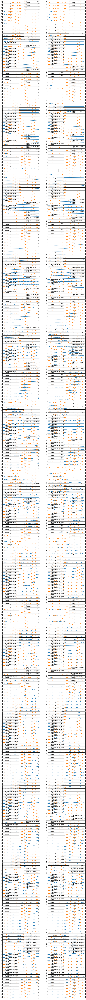

In [ ]:
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize = (20,240))
aic_list = []
plt_num=1
for params in pdq:
    try:
        plt.subplot(int(len(pdq)/2),2,plt_num)
        ARIMA_train = ARIMA(data[:100],order=params)
        arima_model = ARIMA_train.fit()
        print(params,arima_model.aic)
        aic_list.append(arima_model.aic)
        pred = arima_model.predict(start = 100,end=144)
        plt.plot(pred,label='predicted with parameters ' + str(params))
        plt.plot(data[100:],label = 'test data')
        plt.legend()
        plt_num+=1
    except:
        continue # less score is the best model if model is overfit aic will go up > aic = 2k - 2ln(L), k is parameter